<a href="https://colab.research.google.com/github/eldor-fozilov/data-science-contest/blob/main/ds_contest_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### The loaded dataset in the cell that follows includes raw data with 800000 rows with the target variable "business" added

In [2]:
df = pd.read_csv("raw_data_combined.csv")
#fill-up all null-values with 0's
df.fillna(0,inplace = True)

In [4]:
df.head()

,gender,age_code,region_code,c20220101,c20220102,c20220103,c20220104,c20220105,c20220106,c20220107,...,t20220818,t20220819,t20220820,t20220821,t20220822,t20220823,t20220824,t20220825,t20220826,business
0,1,13,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0
1,1,5,1,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,2,6,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,2,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,2,5,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [3]:
#collecting column names for all types of time-series data
dates_logins = []
dates_tx_logins = []
dates_durations = []

for i in df.columns:
  if "c" in i and i[1:].isnumeric():
    dates_logins.append(i)
  if "t" in i and i[1:].isnumeric():
    dates_tx_logins.append(i)
  if "s" in i and i[1:].isnumeric():
    dates_durations.append(i)

## Part 1

### Checking for insights in the demographic variables about "age", "region" and "gender"

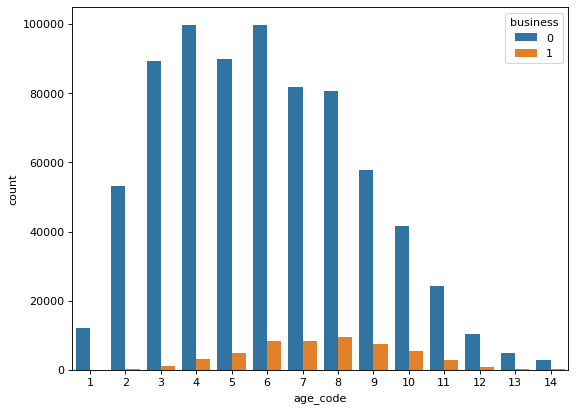

In [5]:
plt.figure(figsize=(8, 6), dpi=80)
sns.countplot(data = df, x = "age_code",hue = "business");

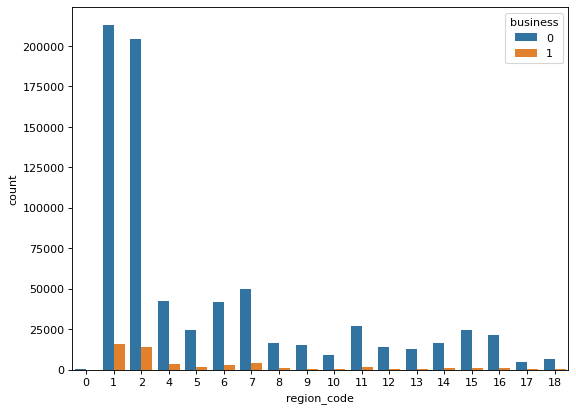

In [8]:
plt.figure(figsize=(8, 6), dpi=80)
sns.countplot(data = df, x = "region_code",hue = "business");

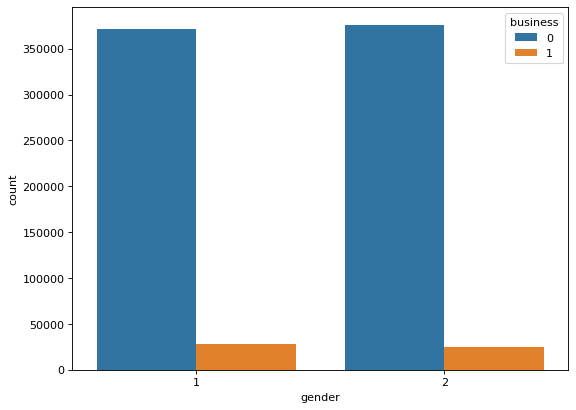

In [9]:
plt.figure(figsize=(8, 6), dpi=80)
sns.countplot(data=df, x="gender", hue="business");
#conclusion: no bias in gender

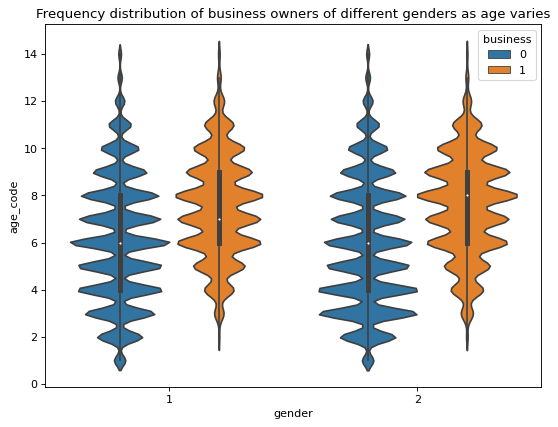

' \nremark: no variability noticeable across genders, but like previously seen, there seems to be variation\nbetween business owners and non-business owners\n'

In [10]:
plt.figure(figsize=(8, 6), dpi=80)
plt.title("Frequency distribution of business owners of different genders as age varies")
sns.violinplot(data=df, x="gender", y="age_code", hue="business")
plt.show()
""" 
remark: no variability noticeable across genders, but like previously seen, there seems to be variation
between business owners and non-business owners
"""

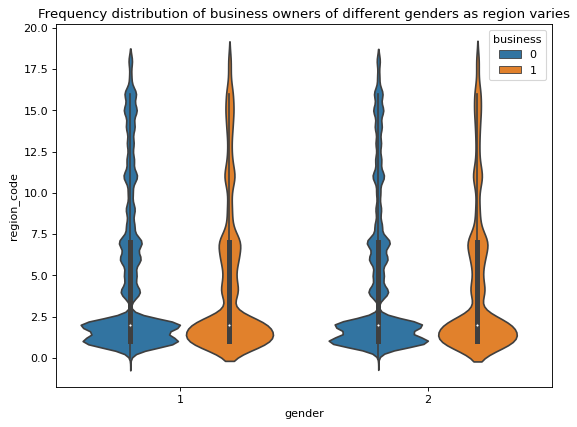

In [11]:
plt.figure(figsize=(8, 6), dpi=80)
plt.title("Frequency distribution of business owners of different genders as region varies")
sns.violinplot(data=df, x="gender", y="region_code", hue="business")
plt.show()

## Part 2

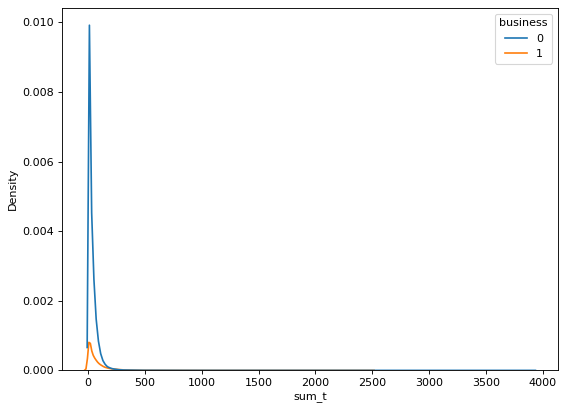

In [ ]:
#making columns for sum of all three types of login data for all individuals and then generating relevant plots
for login_type in ("c","t","s"):
    fetch = df.columns[df.columns.str.startswith(login_type)]
    df["sum_"+login_type] = df[fetch].sum(axis = 1)
    
    #generating plots
    plt.figure(figsize=(8, 6), dpi=80)
    sns.kdeplot(data = df, x = "sum_"+login_type ,hue = "business")
    plt.savefig("sum_"+str(login_type)+".png")
    plt.show()
    

### Do not use the ones below for now

In [ ]:
"""
adding columns that show sum of logins for each date (dd) of the month. 
convention c_dd01 for sum of logins on first day of the month
"""
dates_login_sum_mm = []
dates_transactions_sum_mm = []
dates_durations_sum_mm = []

features_dict = {"c":dates_login_sum_mm,"t":dates_transactions_sum_mm,"s":dates_durations_sum_mm}

dates_dd = ["0"+str(i) for i in range(1,10)]
for i in range(10,32):
    dates_dd.append(str(i))
    
for login_type in ("c","s","t"):
    for i in dates_dd:
        fetch = df.columns[df.columns.str.startswith(login_type) & df.columns.str.endswith(i)]
        df[login_type+"_dd"+i] = df[fetch].sum(axis = 1)
        features_dict[login_type].append(login_type+"_dd"+i)


    

In [ ]:
features_dict["c"]

['c_dd01',
 'c_dd02',
 'c_dd03',
 'c_dd04',
 'c_dd05',
 'c_dd06',
 'c_dd07',
 'c_dd08',
 'c_dd09',
 'c_dd10',
 'c_dd11',
 'c_dd12',
 'c_dd13',
 'c_dd14',
 'c_dd15',
 'c_dd16',
 'c_dd17',
 'c_dd18',
 'c_dd19',
 'c_dd20',
 'c_dd21',
 'c_dd22',
 'c_dd23',
 'c_dd24',
 'c_dd25',
 'c_dd26',
 'c_dd27',
 'c_dd28',
 'c_dd29',
 'c_dd30',
 'c_dd31']

### plotting begins:

In [ ]:
cols = features_dict["c"]
# define subplot grid
fig, axs = plt.subplots(nrows=11, ncols=3, figsize=(10, 10),dpi =1000)
fig.suptitle("density of sum of logins on a particular day of a month")

#loop through tickers and axes
for col, ax in zip(cols, axs.ravel()):
    # filter df for ticker and plot on specified axes
    sns.kdeplot(data = df, x = col ,hue = "business",ax=ax)

plt.savefig("c_dd_kdeplots.png")

    

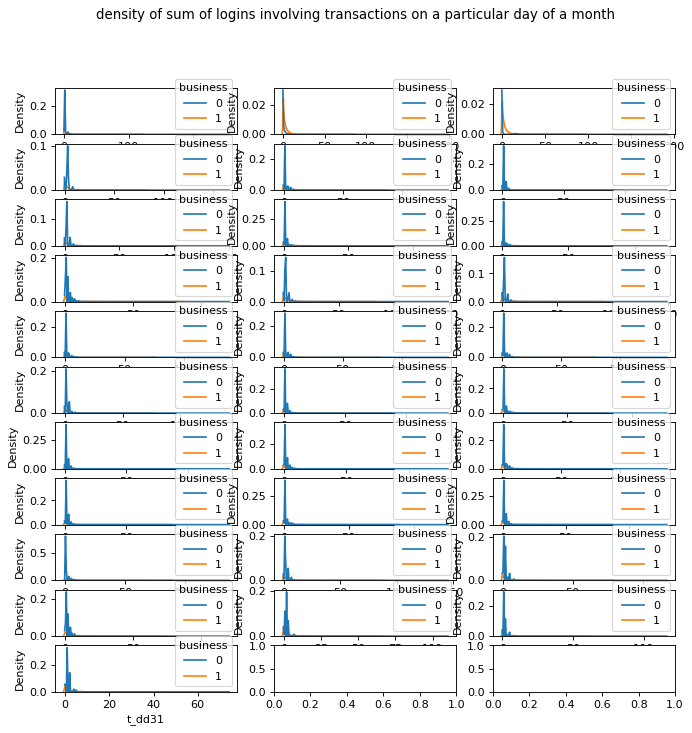

In [ ]:
cols = features_dict["t"]
# define subplot grid
fig, axs = plt.subplots(nrows=11, ncols=3, figsize=(10, 10),dpi =80)
fig.suptitle("density of sum of logins involving transactions on a particular day of a month")

#loop through tickers and axes
for col, ax in zip(cols, axs.ravel()):
    # filter df for ticker and plot on specified axes
    sns.kdeplot(data = df, x = col ,hue = "business",ax=ax)

plt.savefig("t_dd_kdeplots.png")

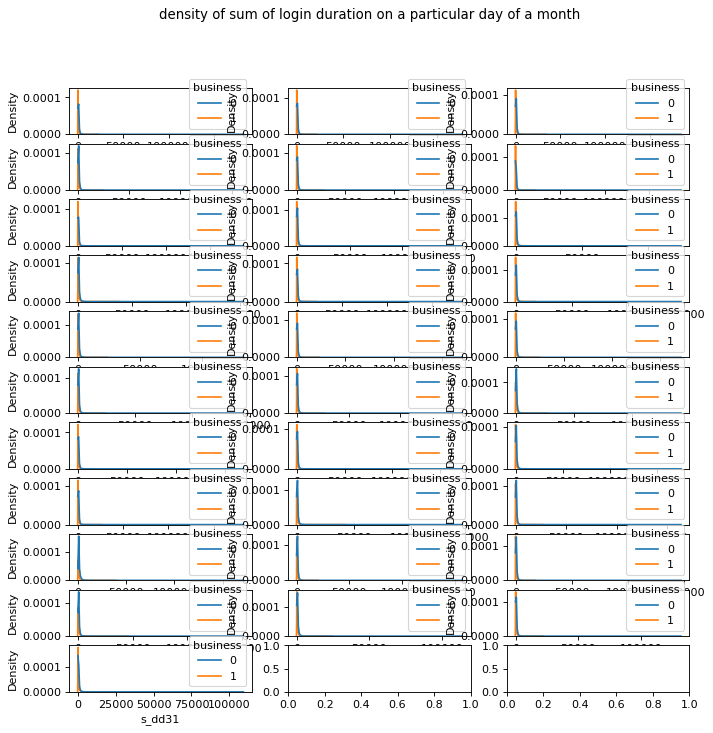

In [ ]:
cols = features_dict["s"]
# define subplot grid
fig, axs = plt.subplots(nrows=11, ncols=3, figsize=(10, 10),dpi =80)
fig.suptitle("density of sum of login duration on a particular day of a month")

#loop through tickers and axes
for col, ax in zip(cols, axs.ravel()):
    # filter df for ticker and plot on specified axes
    sns.kdeplot(data = df, x = col ,hue = "business",ax=ax)

plt.savefig("s_dd_kdeplots.png")

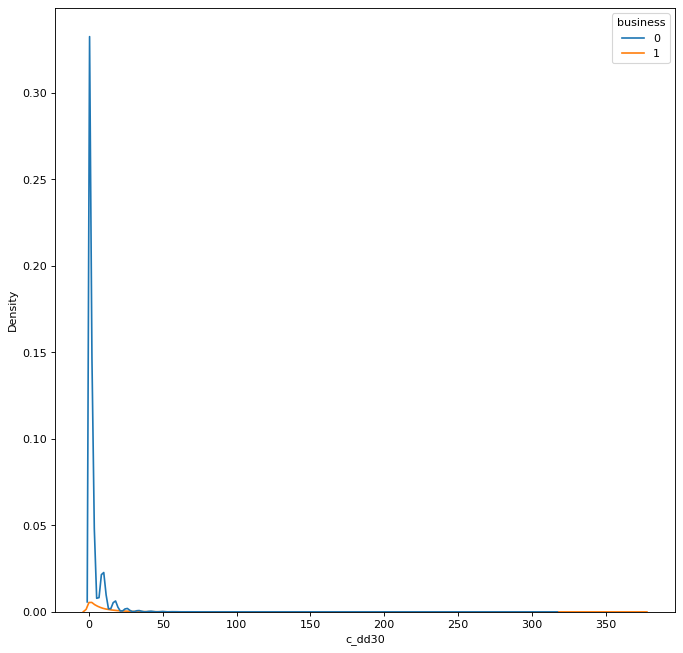

In [ ]:
plt.figure(figsize=(10, 10), dpi=80)

sns.kdeplot(data = df, x = "c_dd30",hue = "business")
plt.show()